In [2]:
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import yaml

import playground

# get full dataset

In [51]:
sessions = [
    "bex_20230221",
    "bex_20230222",
    "bex_20230223",
    "bex_20230224",
    "bex_20230225",
    "bex_20230226",
]
dataset = dict()

for session in sessions:
    with open(f"{session}/meta.yaml") as fyaml:
        try:
            monkey = yaml.safe_load(fyaml)
            monkey["session"] = session
        except yaml.YAMLError as exc:
            print(exc)
    dataset[session] = dict()
    dataset[session]["keypoints"] = playground.preprocess_keypoints(monkey)
    dataset[session]["spikes"] = playground.preprocess_spikes(monkey)

# helpers

In [40]:
def center_of_mass(keypoints):
    """extract center of mass of keypoints.

    Parameters
    ----------
    keypoints : np.ndarray
        shape: (n_frames, n_keypoints, 3)
    """
    neck = keypoints[:, 0]
    s_tail = keypoints[:, 16]
    l_shoulder = keypoints[:, 4]
    r_shoulder = keypoints[:, 7]
    l_hip = keypoints[:, 10]
    r_hip = keypoints[:, 13]
    com = np.stack([neck, s_tail, r_shoulder, l_shoulder, l_hip, r_hip], axis=1)
    com = np.mean(com, axis=1)
    return com

# speed over trial

each timepoint represents 50ms. compute the speed as the difference in position from one frame to the other divided by 0.05 to get the speed in position per second. then average 20 positions at a time to get average speed in 1s. then plot the speed of the whole trial for all trials.

In [88]:
def plot_speed(data, ms):
    fig, axs = plt.subplots(
        len(data), 1, figsize=(6, 1.75 * len(data)), sharex=True, sharey=True
    )
    fig.add_subplot(111, frameon=False)
    plt.tick_params(
        labelcolor="none",
        which="both",
        top=False,
        bottom=False,
        left=False,
        right=False,
    )

    for i, trial in enumerate(data):
        trial = np.reshape(trial, (-1, 1000 // ms, 3))
        delta_pos = np.diff(trial, axis=1)
        distances = np.linalg.norm(delta_pos, axis=2)
        speed = distances * 1000 / ms  # compute in s instead of ms.
        speed = np.mean(speed, axis=1)  # average speed
        axs[i].plot(speed)

    plt.ylabel("Speed")
    axs[0].set_title("Speed of the center of mass over time.")
    axs[-1].set_xlabel("Time (s)")
    plt.tight_layout()

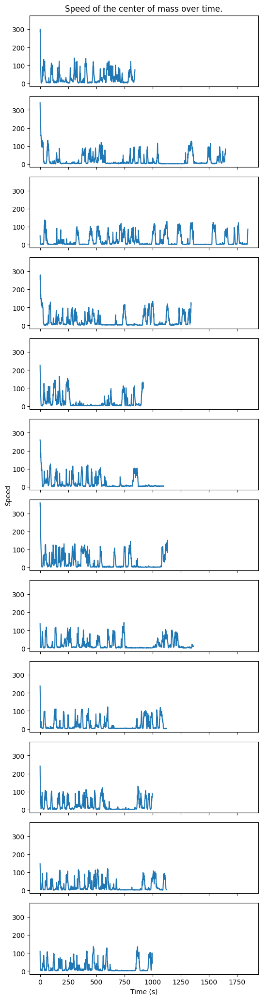

In [89]:
data = []

for session in dataset:
    for trial_kps in dataset[session]["keypoints"]:
        trial_kps = np.reshape(trial_kps, (-1, 18, 3))
        data.append(center_of_mass(trial_kps))

plot_speed(data, ms=50)

# trace over trial for a fixed channel

plot trace of neural activity for all trials, but with channel fixed.

In [178]:
def plot_trace(data, beg=0, end=200, ms=50, scale="ms"):
    fig, axs = plt.subplots(
        len(data), 1, figsize=(10, 1.75 * len(data)), sharex=True, sharey=True
    )
    fig.add_subplot(111, frameon=False)
    plt.tick_params(
        labelcolor="none",
        which="both",
        top=False,
        bottom=False,
        left=False,
        right=False,
    )
    for i, trial_spks in enumerate(data):
        if scale == "ms":
            time = ms * np.arange(len(trial_spks[beg:end]))
        else:
            time = np.arange(len(trial_spks[beg:end])) * ms // 1000
        axs[i].plot(time, trial_spks[beg:end])
    plt.ylabel("Spike count")
    if scale == "ms":
        plt.xlabel("Time (ms)")
    else:
        plt.xlabel("Time (s)")
    axs[0].set_title("Spike count for the same channel.")
    plt.tight_layout()

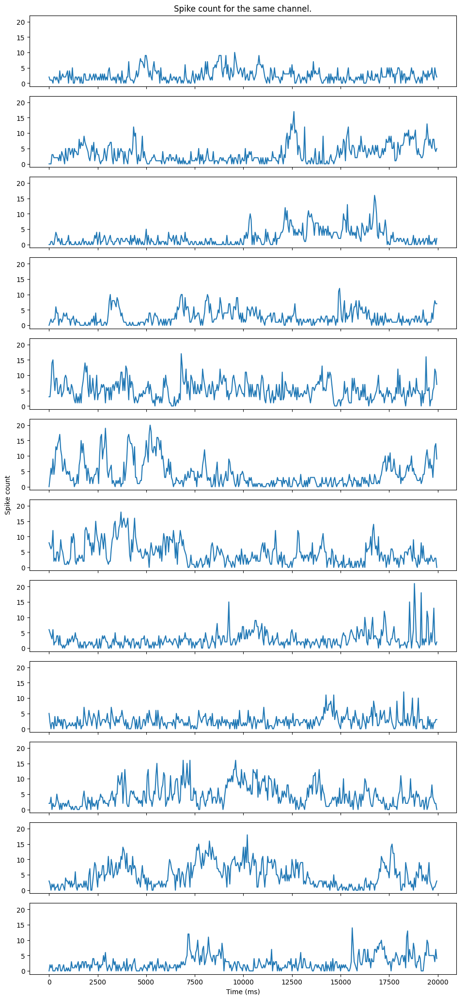

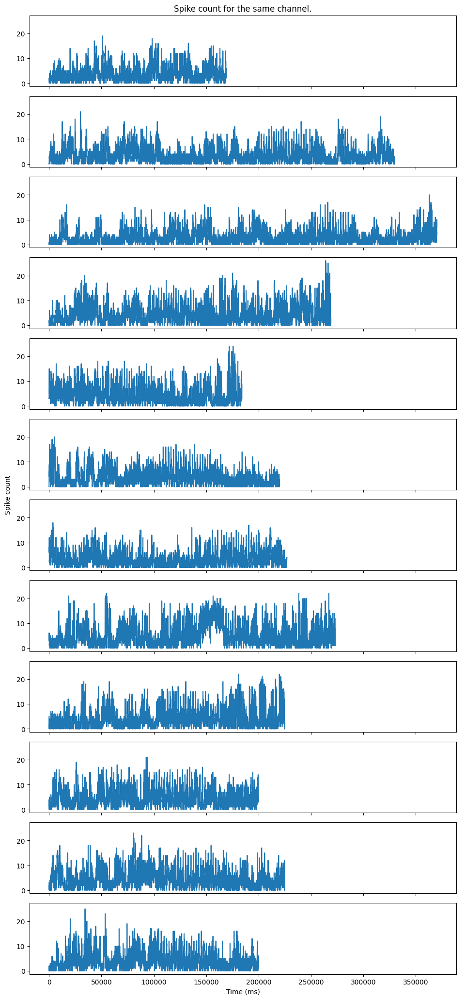

In [179]:
data = []
ch = 0

for session in dataset:
    for trial_spks in dataset[session]["spikes"]:
        trial_spks = trial_spks[:, ch]
        trial_spks = np.reshape(trial_spks, (-1, 5))
        trial_spks = np.sum(trial_spks, axis=1)
        data.append(trial_spks)

plot_trace(data, end=20 * 20)
plot_trace(data, end=max(len(trial) for trial in data), scale="ms")

# keypoints at bad prediction spots

visualize the keypoints at the bad prediction spots. for this analysis, i'm selecting the test trial and the training trial from the same session (`bex_20230226`).

In [85]:
skeleton = [
    [16, 17],
    [16, 10],
    [16, 13],
    [14, 13],
    [14, 15],
    [11, 10],
    [11, 12],
    [8, 7],
    [8, 9],
    [5, 4],
    [5, 6],
    [0, 16],
    [0, 3],
    [0, 4],
    [0, 7],
    [0, 1],
    [0, 2],
    [3, 1],
    [3, 2],
]
keypoints = np.load("bex_20230226/keypoints/raw_keypoints.npy")
train = keypoints[2500:22500].reshape(-1, 18, 3)
test = keypoints[79000:101500].reshape(-1, 18, 3)
validation = keypoints[146000:166000].reshape(-1, 18, 3)

keypoints = np.load("bex_20230225/keypoints/raw_keypoints.npy")
train_2 = keypoints[90500:113000].reshape(-1, 18, 3)

with open("forge_train.pkl", "wb") as f:
    train_dict = {"sequence": train, "skeleton": skeleton, "frametime": 100}
    pickle.dump(train_dict, f)

# with open("forge_train_two.pkl", "wb") as f:
#     train_dict = {"sequence": train_2, "skeleton": skeleton, "frametime": 100}
#     pickle.dump(train_dict, f)

with open("forge_test.pkl", "wb") as f:
    test_dict = {"sequence": test, "skeleton": skeleton, "frametime": 100}
    pickle.dump(test_dict, f)

with open("forge_val.pkl", "wb") as f:
    val_dict = {"sequence": validation, "skeleton": skeleton, "frametime": 100}
    pickle.dump(val_dict, f)

In [100]:
from forge.utils.loader import load
from forge.plot import animate

data = load('forge_test.pkl')
config = {
    'framerate': 30,
    'subject_name': 'bexter'
}
animate(data.animation['pose'][:1000], data.animation['edges'], config)

# correlation of the prediction vs speed

/Users/caio/datasets/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/caio/datasets/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


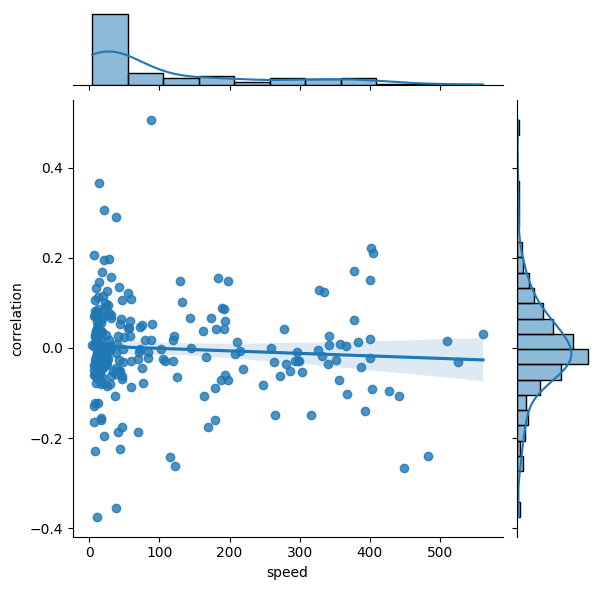

In [79]:
# compute average speed in 1s intervals
# scatterplot of speed x correlation
with open("pred.pkl", "rb") as f:
    data = pickle.load(f)

gt = np.array(data["gt"]).reshape(-1, 20, 120)
pred = np.array(data["pred"]).reshape(-1, 20, 120)

n_intervals = gt.shape[0]
n_channels = gt.shape[2]
corrs = np.empty((n_intervals, n_channels))
for i in range(n_intervals):
    for ch in range(n_channels):
        corrs[i, ch] = np.corrcoef(gt[i, :, ch], pred[i, :, ch])[0, 1]
corrs = np.nanmean(corrs, axis=1)

keypoints = (
    dataset["bex_20230226"]["keypoints"][1].reshape(-1, 5, 18, 3).mean(axis=1)
)
com = center_of_mass(keypoints)
com = np.reshape(com, (-1, 20, 3))
delta_pos = np.diff(com, axis=1)
distances = np.linalg.norm(delta_pos, axis=2)
speed = distances * 1000 / 50  # compute in s instead of ms.
speed = np.mean(speed, axis=1)

pd_data = pd.DataFrame({"speed": speed, "correlation": corrs})
sns.jointplot(pd_data, x="speed", y="correlation", kind="reg")

# scatterplot of predictions for different datasets

0.1951049752711849
0.17886153869722524
0.13132676031776935


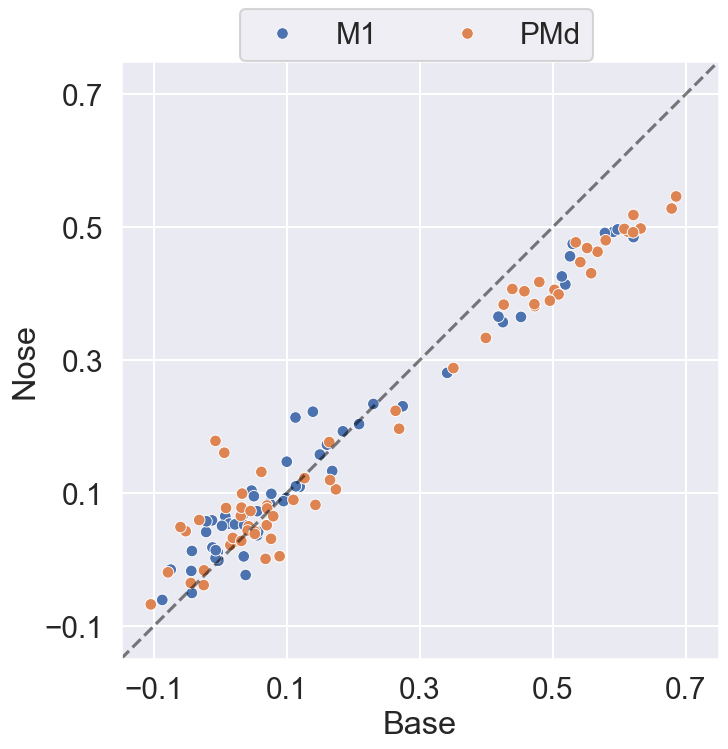

In [80]:
base = np.load("predictions/playground_overlapless_rnn_pred.npy")
diff = np.load("predictions/playground_diff_overlapless_rnn_pred.npy")
gt = np.load("bex_20230226/spikes/raw_spikes.npy")
gt = gt[79000:101500].reshape(-1, 5, 120).sum(1)
areas = ["M1"] * 56 + ["PMd"] * 64

base_corr = np.array(
    [np.corrcoef(base[:, ch], gt[:, ch])[0, 1] for ch in range(120)]
)
print(base_corr.mean())
diff_corr = np.array(
    [np.corrcoef(diff[:, ch], gt[:, ch])[0, 1] for ch in range(120)]
)
print(diff_corr.mean())

base_diff_pd = pd.DataFrame(
    {"base": base_corr, "diff": diff_corr, "area": areas}
)

sns.set_theme(rc={"figure.figsize": (8, 8)})
sns.set_context("talk", font_scale=1.3)

min_val, max_val = -0.15, 0.75
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xticks(np.arange(-0.1, 0.75, 0.2))
plt.yticks(np.arange(-0.1, 0.75, 0.2))
plt.axis("scaled")
sns.scatterplot(base_diff_pd, x="base", y="diff", hue="area", s=70)
plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    linestyle="--",
    color="black",
    alpha=0.5,
)
plt.xlabel("Base")
plt.ylabel("Nose")
plt.legend(ncols=2, loc=(0.2, 1))
plt.tight_layout()

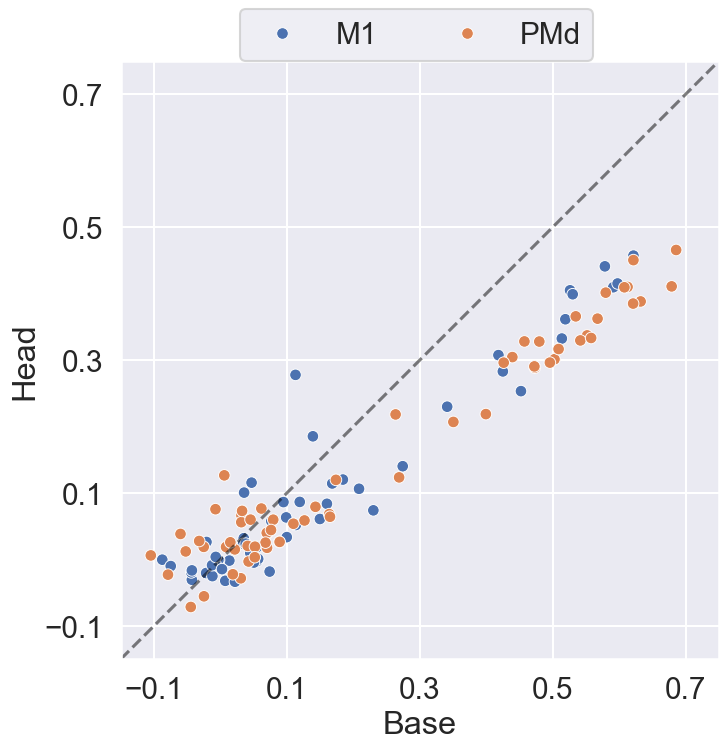

In [81]:
head = np.load("predictions/playground_head_overlapless_rnn_pred.npy")
head_corr = np.array(
    [np.corrcoef(head[:, ch], gt[:, ch])[0, 1] for ch in range(120)]
)
print(head_corr.mean())
base_head_pd = pd.DataFrame(
    {"base": base_corr, "head": head_corr, "area": areas}
)

min_val, max_val = -0.15, 0.75
plt.xlim(min_val, max_val)
plt.ylim(min_val, max_val)
plt.xticks(np.arange(-0.1, 0.75, 0.2))
plt.yticks(np.arange(-0.1, 0.75, 0.2))
plt.axis("scaled")
sns.scatterplot(base_head_pd, x="base", y="head", hue="area", s=70)
plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    linestyle="--",
    color="black",
    alpha=0.5,
)
plt.xlabel("Base")
plt.ylabel("Head")
plt.legend(ncols=2, loc=(0.2, 1))
plt.tight_layout()

# window size x correlation

In [28]:
pred = np.load("predictions/playground_overlapless_rnn_pred.npy")
gt = (
    np.load("bex_20230226/spikes/raw_spikes.npy")[79000:101500]
    .reshape(-1, 5, 120)
    .sum(1)
)
lengths = [20, 100, 500, 750, 900, 1500, 2250, 4500]
lengths_s = [int(x // 20) for x in lengths]
corrs = []

for l in lengths:
    tmp_gt = np.reshape(gt, (-1, l, 120))
    tmp_pred = np.reshape(pred, (-1, l, 120))
    corr = np.empty((tmp_gt.shape[0], 120))
    for c in range(120):
        for i in range(tmp_gt.shape[0]):
            corr[i, c] = np.corrcoef(tmp_gt[i, :, c], tmp_pred[i, :, c])[0, 1]
    corr = np.nanmean(corr, axis=0)
    corr = np.nanmean(corr)
    corrs.append(corr)

corrs_df = pd.DataFrame({"length": lengths_s, "correlation": corrs})

/Users/caio/datasets/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/caio/datasets/venv/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


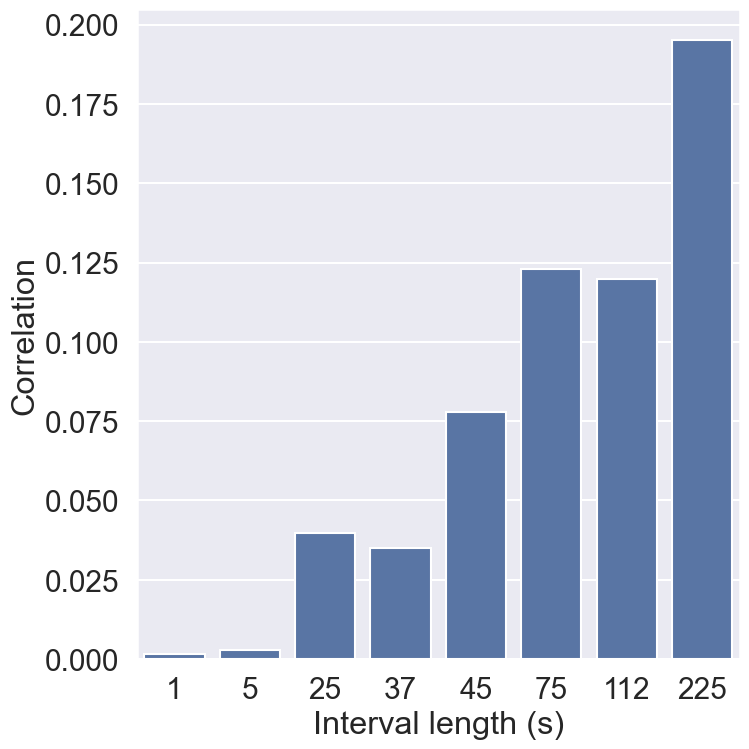

In [84]:
sns.barplot(data=corrs_df, x="length", y="correlation")
plt.xlabel("Interval length (s)")
plt.ylabel("Correlation")
plt.tight_layout()

<StemContainer object of 3 artists>

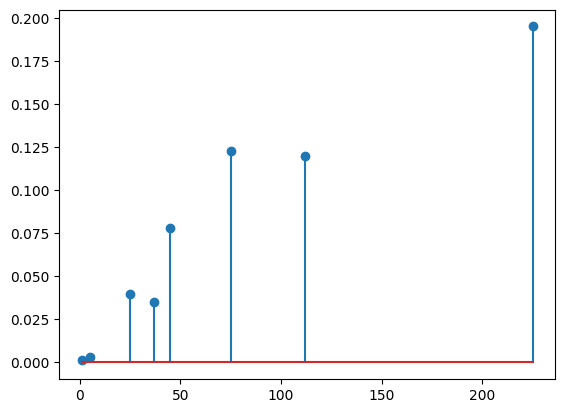

In [34]:
plt.stem(corrs_df["length"], corrs_df["correlation"])